# AMATH481 Computational Notebook
## Scientific Computing for Quantitative Finance

**Author:** Konoka Hamada  
**Affiliation:** University of Washington | Computational Finance & Risk Management  
**Date:** December 2025

---

## Table of Contents
1. **Introduction**
2. **Concept Highlights: Physics and Finance**
3. **Method Map**
4. **Quantum Harmonic Oscillator:** Eigenvalue Problems & Spectral Methods
5. **Vorticity-Streamfunction Equations:** Fluid Dynamics & Time-Stepping Solvers
6. **Reaction-Diffusion Systems:** Pattern Formation & Spectral Differentiation
7. **Conclusion**

---

## 1. Introduction

This notebook serves as a comprehensive archive of the scientific computing techniques covered during the AMATH 481 course (Fall 2025). While the core problems presented here stem from physics—quantum mechanics, fluid dynamics, and chemical reactions—the numerical methods employed are universally applicable to quantitative finance.

### How to use this notebook
I created this notebook not just for review, but as a guidebook for my future research reference in Computational Finance. It helps me quickly find useful code to solve equations and visualize data.

**Computational Setup:**
The code in this notebook is optimized for **Google Colab** (Python 3.10+). It relies on standard scientific libraries: `numpy`, `scipy`, and `matplotlib`.

---

## 2. Concept Highlights: Physics and Finance

Here, I will show how the three major physical problems explored in this project can be apllied to my research interests, finance, especially in ESG Finance, Spillover Effects, and Time-Series Econometrics.

### Quantum Harmonic Oscillator
* The mathematics of the Schrödinger equation shares deep roots with **Stochastic Calculus** used in options pricing (Black-Scholes is effectively a diffusion equation). Furthermore, the **Spectral Methods** (eigenvalue decomposition) used here are directly applicable to **Principal Component Analysis (PCA)** in yield curve modeling and **Financial Network Analysis** to identify systemic risk centers (eigen-centrality).

### Vorticity-Streamfunction Equations (Navier-Stokes)
* Fluid dynamics offers a powerful analogy for **Market Microstructure** and **Order Flow**. The concept of "turbulence" in fluids is mathematically analogous to **Volatility Clustering** in financial time series. Additionally, solving these transport equations aids in understanding **Spillover Effects**—how shocks (vorticity) propagate from one market sector (e.g., Energy) to another (e.g., Equity) over time.

### Reaction-Diffusion Systems
*  This is highly relevant to **ESG & Contagion Risk modeling**.
    * *Reaction:* Represents the internal market sentiment or ESG news impact within a specific asset.
    * *Diffusion:* Represents the transmission of risk across the global financial network.
    * This framework supports my research on constructing **Sentiment-based ESG risk indicators**, modeling how "fear" or "green sentiment" diffuses through market networks.

---

## 3. Method Map

The following mapping categorizes how specific numerical methods are applied across the three major physical problems. This guide helps in selecting the right tool for future quantitative problems.

| Numerical Method | Application in this Notebook | Problem Reference |
| :--- | :--- | :--- |
| **ODE Solvers (IVP)** | Time-stepping for evolution equations (RK45) | **Vorticity**, **Reaction-Diffusion** |
| **ODE Solvers (BVP)** | Shooting methods for boundary value problems | **Quantum Oscillator** |
| **Finite Difference** | Constructing sparse matrices (Laplacian, Derivatives) | **Quantum Oscillator**, **Vorticity** |
| **Stability Analysis** | Determining time-step constraints (CFL condition) | **Vorticity**, **Reaction-Diffusion** |
| **FFT (Fast Fourier Transform)** | Solving Poisson equations & derivatives on periodic domains | **Vorticity**, **Reaction-Diffusion** |
| **Spectral Methods** | High-accuracy differentiation (Chebyshev, Hermite) | **Quantum Oscillator**, **Reaction-Diffusion** |

# 4. Quantum Harmonic Oscillator

## Problem Statement
In this section, we solve the **Schrödinger Equation** for a Quantum Harmonic Oscillator.
Mathematically, this is a **Boundary Value Problem (BVP)** and an **Eigenvalue Problem**. We look for energy levels (eigenvalues, $\epsilon_n$) and wave functions (eigenfunctions, $\phi_n$) that satisfy the time-independent Schrödinger equation:

$$
\frac{d^2\phi_n}{dx^2} - (Kx^2 - \epsilon_n)\phi_n = 0
$$

Subject to the boundary conditions and normalization constraint:

1. **Decay at Infinity:** $\phi_n(x) \rightarrow 0$ as $x \rightarrow \pm \infty$
2. **Normalization:** $\int_{-\infty}^{\infty} |\phi_n(x)|^2 dx = 1$

Here, the potential is harmonic $V(x) = Kx^2$, and we solve for the first five modes ($n=0,1,2,3,4$).

## Algorithms

We implement three numerical approaches to solve this problem, exploring linear and nonlinear regimes.

### Method 1: The Shooting Method
To solve this BVP numerically, we employ the **Shooting Method**, treating the energy $\epsilon$ as a shooting parameter.

* **Reduction to System of ODEs:** Convert the second-order ODE into a system of two first-order ODEs:
$$
y_1 = \phi, \quad y_2 = \phi' \implies \begin{pmatrix} y_1' \\ y_2' \end{pmatrix} = \begin{pmatrix} y_2 \\ (Kx^2 - \epsilon)y_1 \end{pmatrix}
$$

* **Initial Value Guess (Left Boundary):** At $x = -L$, impose the asymptotic boundary condition $\phi'(-L) - \sqrt{KL^2 - \epsilon}\phi(-L) = 0$ to set initial conditions $y(-L)$.

* **Integration:** Integrate the system forward from $x = -L$ to $x = +L$ using an IVP solver (Runge-Kutta methods).

* **Boundary Check (Right Boundary):** Check if the solution satisfies the boundary condition at $x = +L$. We define a residual function $r(\epsilon)$ based on the Robin boundary condition:
$$
r(\epsilon) = \phi'(L) + \sqrt{KL^2 - \epsilon}\phi(L)
$$

* **Root Finding:** Adjust $\epsilon$ iteratively (using bisection or Newton's method logic) until the residual $r(\epsilon) \approx 0$.

### Method 2: Direct Matrix Method (Finite Difference)
Alternatively, we can discretize the domain and convert the differential operator into a linear algebra problem.

* **Discretization:** The domain $x \in [-L, L]$ is discretized into $N$ points with spacing $\Delta x$.
* **Finite Difference Approximation:** The second derivative is approximated using a central difference scheme:
$$
\frac{d^2\phi}{dx^2} \approx \frac{\phi_{i+1} - 2\phi_i + \phi_{i-1}}{\Delta x^2}
$$
* **Matrix Construction:** This yields a matrix eigenvalue problem $A\vec{\phi} = \lambda \vec{\phi}$. The matrix $A$ contains the kinetic energy (tridiagonal structure) and potential energy (diagonal) terms.
* **Boundary Conditions:** The first and last rows of $A$ are modified to satisfy the Robin boundary conditions at $\pm L$.
* **Solution:** We find the eigenvalues and eigenvectors of the sparse matrix $A$ using `eigs`.

### Method 3: Nonlinear Extension (Double-Loop Shooting)
We also investigate a nonlinear variant (e.g., Gross-Pitaevskii equation for Bose-Einstein condensates) where the potential depends on the particle density:
$$
\frac{d^2\phi_n}{dx^2} - (\gamma |\phi_n|^2 + Kx^2 - \epsilon_n)\phi_n = 0
$$

* **Coupling:** The term $\gamma |\phi_n|^2$ makes the operator dependent on the solution's amplitude.
* **Algorithm:** This requires a **Double Loop**:
    1.  **Outer Loop (Energy):** Adjust $\epsilon$ to satisfy boundary conditions (decay at infinity).
    2.  **Inner Loop (Amplitude):** For a fixed $\epsilon$, adjust the initial amplitude $A$ until the normalization condition $\int |\phi|^2 = 1$ is met.

## Matlab Implementation
The following table maps the standard MATLAB functions used in the course to the Python (`scipy`/`numpy`) equivalents used in this notebook.

| Operation | MATLAB Function | Python Equivalent (Used here) |
| :--- | :--- | :--- |
| **IVP Solver** | `ode45` / `ode15s` | `scipy.integrate.solve_ivp` (RK45) or `odeint` |
| **Sparse Eigensolver** | `eigs` | `scipy.sparse.linalg.eigs` |
| **Integration** | `trapz` | `numpy.trapezoid` (or `scipy.integrate.trapezoid`) |
| **Linear Algebra** | `inv`, `eig` | `numpy.linalg.inv`, `numpy.linalg.eig` |

Shooting Method Eigenvalues: [0.99999998 2.9999994  4.99998953 6.9998832  8.99906075]
Direct Method Eigenvalues:   [0.99937352 2.996839   4.99140656 6.98038865 8.95060003]
Nonlinear (+0.05) Energies: [1.012939453125, 2.921435546875002]
Nonlinear (-0.05) Energies: [0.9740478515625, 2.893090820312502]


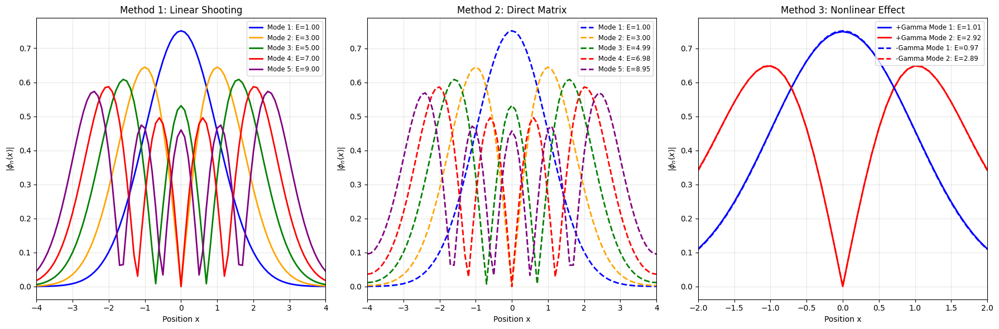

In [ ]:
import numpy as np
from scipy.integrate import odeint, solve_ivp
from scipy.sparse.linalg import eigs
import matplotlib.pyplot as plt

# ============================================================
# Setting up the Computational Domain
# ============================================================
tol = 1e-4          # Tolerance for the shooting method
L = 4.0             # Boundary at +/- L (approximation of infinity)
K = 1.0             # Constant in the potential V(x) = K*x^2
dx = 0.1            # Spatial step size
xspan = np.arange(-L, L + dx, dx)  # Discretized x domain

# ============================================================
# Method 1: Shooting Method
# ============================================================
# Arrays to store results
eigenfunctions_shoot = np.zeros((len(xspan), 5))
eigenvalues_shoot = np.zeros(5)

def shoot_rhs(y, x, epsilon, K):
    """
    Defines the ODE system: phi'' = (K*x^2 - epsilon)*phi
    Transformed into two 1st order ODEs:
    y[0] = phi
    y[1] = phi'
    """
    return [y[1], (K * x**2 - epsilon) * y[0]]

eps_start = 0.1  # Start guessing epsilon from a low value

for mode in range(1, 6):  # We want the first 5 modes
    epsilon = eps_start
    d_epsilon = 0.2  # Step size for adjusting epsilon

    # Convergence loop
    for _ in range(1000):
        # Boundary Condition at x = -L (Left side)
        # We use the asymptotic behavior: phi' - sqrt(KL^2 - eps)*phi = 0
        s = np.sqrt(max(K * L**2 - epsilon, 0.0))
        y0 = [1.0, s]  # Initial conditions: [phi, phi']

        # Integrate ODE from -L to L
        y = odeint(shoot_rhs, y0, xspan, args=(epsilon, K))

        # Check Boundary Condition at x = +L (Right side)
        # Residual r should be 0 if epsilon is a true eigenvalue
        r = y[-1, 1] + np.sqrt(max(L**2 - epsilon, 0.0)) * y[-1, 0]

        if abs(r) < tol:
            # Converged! Store results
            eigenvalues_shoot[mode - 1] = epsilon
            eigenfunctions_shoot[:, mode - 1] = y[:, 0]
            break

        # Adjust epsilon using Bisection approach logic
        if ((-1)**(mode + 1)) * r > 0:
            epsilon += d_epsilon
        else:
            epsilon -= d_epsilon
            d_epsilon /= 2.0  # Reduce step size to refine search

    eps_start = epsilon + 0.1 # Update start for next mode

    # Normalization: Integral of |phi|^2 dx = 1
    norm = np.trapezoid(eigenfunctions_shoot[:, mode-1]**2, xspan)
    eigenfunctions_shoot[:, mode-1] /= np.sqrt(norm)
    # Ensure positive orientation for consistency
    eigenfunctions_shoot[:, mode-1] = np.abs(eigenfunctions_shoot[:, mode-1])

print(f"Shooting Method Eigenvalues: {eigenvalues_shoot}")


# ============================================================
# Method 2: Direct Matrix Method (Finite Difference)
# ============================================================
N = len(xspan)
n = N - 2  # Interior points only
A = np.zeros((n, n))

# Construct the Finite Difference Matrix A
# A corresponds to operator: -d^2/dx^2 + V(x)
for i in range(n):
    xi = xspan[i + 1]
    # Main diagonal: 2/dx^2 + V(x) -> scaled by dx^2 becomes: -2 - V(x)*dx^2
    # Note: We are solving A*phi = lambda*phi, formulation slightly adjusted
    A[i, i] = -2.0 - (K * dx**2 * xi**2)
    if i < n - 1:
        A[i, i + 1] = 1.0  # Upper diagonal
        A[i + 1, i] = 1.0  # Lower diagonal

# Boundary Conditions (Robin BCs derived from asymptotic behavior)
# Adding terms to the corners of the matrix to account for boundaries
A[0, 0] += 4.0 / 3.0
A[0, 1] += -1.0 / 3.0
A[-1, -2] += -1.0 / 3.0
A[-1, -1] += 4.0 / 3.0

# Solve Eigenvalue problem
# We look for 'SM' (Smallest Magnitude) eigenvalues
vals, vecs = eigs(-A, k=5, which='SM')

# Process results
vals = vals.real
idx = np.argsort(vals)  # Sort by energy level
vals = vals[idx]
vecs = vecs.real[:, idx]

eigenvalues_direct = vals / (dx**2) # Scale back by dx^2

# Add boundary points back to eigenvectors
phi0 = (4.0 / 3.0) * vecs[0, :] - (1.0 / 3.0) * vecs[1, :]
phin = (4.0 / 3.0) * vecs[-1, :] - (1.0 / 3.0) * vecs[-2, :]
eigenfunctions_direct = np.vstack([phi0, vecs, phin])

# Normalization
for i in range(5):
    norm = np.trapezoid(eigenfunctions_direct[:, i]**2, xspan)
    eigenfunctions_direct[:, i] /= np.sqrt(norm)
    eigenfunctions_direct[:, i] = np.abs(eigenfunctions_direct[:, i])

print(f"Direct Method Eigenvalues:   {eigenvalues_direct}")


# ============================================================
# Method 3: Nonlinear Problem (Cubic Term)
# ============================================================
# Concept: We introduce a nonlinear term (gamma * |phi|^2).
# This means the wave function interacts with itself.
# Because of this, the Amplitude of the wave affects the Energy.
# We need a "Double Loop":
#   - Inner Loop: Find the correct Amplitude (Normalization = 1).
#   - Outer Loop: Find the correct Energy (Boundary Condition).

# Define parameters specifically for the nonlinear problem (smaller domain).
L_nl = 2.0
dx_nl = 0.1
K_nl = 1.0
xspan_nl = np.arange(-L_nl, L_nl + dx_nl, dx_nl)

def solve_nonlinear_ode(amplitude_guess, epsilon, gamma):
    """
    Solves the nonlinear differential equation using a guess for amplitude and energy.
    Equation: phi'' - (gamma*|phi|^2 + K*x^2 - epsilon)*phi = 0
    """
    # Boundary condition at x = -L (Left side)
    s = np.sqrt(max(K_nl * L_nl**2 - epsilon, 0.0))
    y0 = [amplitude_guess, amplitude_guess * s]

    def rhs(x, y):
        phi, dphi = y
        # The term (gamma * phi^2) makes it nonlinear.
        return [dphi, (gamma * (phi**2) + K_nl * (x**2) - epsilon) * phi]

    # We use 'solve_ivp' here because it is more robust for this specific problem.
    solution = solve_ivp(rhs, t_span=(xspan_nl[0], xspan_nl[-1]), y0=y0,
                         t_eval=xspan_nl, method='RK45')

    # Return the solution (Transposed to match our format: rows=points, cols=variables)
    # Also return the actual time points where the solution was computed
    return solution.y.T, solution.t

def calculate_nonlinear_modes(gamma_value):
    """
    Runs the double-loop shooting method for a specific gamma.
    Returns the first 2 modes (eigenfunctions) and their energies.
    """
    found_modes = []
    found_energies = []

    eps_start_nl = 0.1 # Start searching for energy from here

    # Loop to find the first 2 modes
    for mode in range(1, 3):
        epsilon = eps_start_nl
        d_epsilon = 0.1
        amplitude = 1.0 # Initial guess for the wave's height

        # Outer Loop: Adjust Energy (Epsilon)
        for _ in range(1000):

            # Inner Loop: Adjust Amplitude (Normalization)
            # Since the equation is nonlinear, changing amplitude changes the shape!
            for _ in range(1000):
                # Solve the ODE with current guesses
                y_sol, t_sol = solve_nonlinear_ode(amplitude, epsilon, gamma_value)
                phi = y_sol[:, 0]

                # Check Normalization (Total probability must be 1)
                # Use t_sol (actual time points) for trapezoidal integration
                norm = np.trapezoid(phi**2, t_sol)

                # If normalized, stop the inner loop.
                if abs(norm - 1.0) < tol:
                    break

                # Otherwise, scale the amplitude guess and try again.
                if norm > 0:
                    amplitude /= np.sqrt(norm)
                else:
                    amplitude = 1.0 # Reset if numerical error occurs

            # Check Boundary Condition (Right side)
            # Does the solution decay correctly at x = +L?
            # Use the last point of the *actual* solution for boundary check
            phi_right = y_sol[-1, 0]
            dphi_right = y_sol[-1, 1]
            s = np.sqrt(max(K_nl * L_nl**2 - epsilon, 0.0))
            residual = dphi_right + s * phi_right

            if abs(residual) < tol:
                break # Energy is correct!

            # Adjust Energy guess (Bisection)
            if ((-1)**(mode + 1)) * residual > 0:
                epsilon += d_epsilon
            else:
                epsilon -= d_epsilon / 2.0
                d_epsilon /= 2.0

        # Store results
        found_modes.append(np.abs(y_sol[:, 0]))
        found_energies.append(epsilon)
        eps_start_nl = epsilon + 0.1 # Prepare for next mode

    return found_modes, found_energies

# Run the calculation for two cases:
# Case 1: Positive Gamma (Attractive nonlinearity)
modes_pos, energies_pos = calculate_nonlinear_modes(gamma_value=0.05)

# Case 2: Negative Gamma (Repulsive nonlinearity)
modes_neg, energies_neg = calculate_nonlinear_modes(gamma_value=-0.05)

print(f"Nonlinear (+0.05) Energies: {energies_pos}")
print(f"Nonlinear (-0.05) Energies: {energies_neg}")


# ============================================================
# Visualization
# ============================================================
plt.figure(figsize=(18, 6))

# Plot 1: Shooting Method Results (Linear)
plt.subplot(1, 3, 1)
colors = ['blue', 'orange', 'green', 'red', 'purple']
for i in range(5):
    plt.plot(xspan, eigenfunctions_shoot[:, i],
             color=colors[i], lw=2,
             label=fr'Mode {i+1}: E={eigenvalues_shoot[i]:.2f}')

plt.title("Method 1: Linear Shooting")
plt.xlabel("Position x")
plt.ylabel(r"|$\phi_n(x)$|")
plt.legend(loc='upper right', fontsize='small')
plt.grid(True, alpha=0.3)
plt.xlim(-L, L)

# Plot 2: Direct Method Results (Linear)
plt.subplot(1, 3, 2)
for i in range(5):
    plt.plot(xspan, eigenfunctions_direct[:, i],
             color=colors[i], lw=2, linestyle='--',
             label=fr'Mode {i+1}: E={eigenvalues_direct[i]:.2f}')

plt.title("Method 2: Direct Matrix")
plt.xlabel("Position x")
plt.ylabel(r"|$\phi_n(x)$|")
plt.legend(loc='upper right', fontsize='small')
plt.grid(True, alpha=0.3)
plt.xlim(-L, L)

# Plot 3: Nonlinear Results (Method 3)
plt.subplot(1, 3, 3)
# Plot Positive Gamma (Solid lines)
plt.plot(xspan_nl, modes_pos[0], 'b-', lw=2, label=fr'+Gamma Mode 1: E={energies_pos[0]:.2f}')
plt.plot(xspan_nl, modes_pos[1], 'r-', lw=2, label=fr'+Gamma Mode 2: E={energies_pos[1]:.2f}')
# Plot Negative Gamma (Dashed lines)
plt.plot(xspan_nl, modes_neg[0], 'b--', lw=2, label=fr'-Gamma Mode 1: E={energies_neg[0]:.2f}')
plt.plot(xspan_nl, modes_neg[1], 'r--', lw=2, label=fr'-Gamma Mode 2: E={energies_neg[1]:.2f}')

plt.title("Method 3: Nonlinear Effect")
plt.xlabel("Position x")
plt.ylabel(r"|$\phi_n(x)$|")
plt.legend(loc='upper right', fontsize='small')
plt.grid(True, alpha=0.3)
plt.xlim(-L_nl, L_nl)

plt.tight_layout()
plt.show()

# 5. Vorticity-Streamfunction Equations

## Problem Statement
In this problem, we simulate the **2D Navier-Stokes equations** for incompressible fluid flow. Instead of tracking velocity ($u, v$) and pressure ($p$) directly, we use the **Vorticity-Streamfunction formulation**.

* **Vorticity ($\omega$):** Measures the local "spin" or rotation of the fluid particles.
* **Streamfunction ($\psi$):** A scalar field related to velocity. Its contour lines represent the path of fluid particles.

**Goal:** We solve the evolution equation for vorticity:

$$
\frac{\partial \omega}{\partial t} = -[\psi, \omega] + \nu \nabla^2 \omega
$$

where $[\psi, \omega]$ is the advection term (fluid moving) and $\nu \nabla^2 \omega$ is the diffusion term (viscosity smoothing).

## Algorithm
To find how the vorticity $\omega$ changes over time, we follow these specific steps at every time step:

1. **Given:** Current vorticity field $\omega$.
2. **Solve Streamfunction:** Solve the Poisson equation for $\psi$.
   $$\nabla^2 \psi = \omega$$
   (We use various linear solvers here: Direct, LU, BiCGSTAB, GMRES, and FFT).
3. **Compute Velocities:** Calculate gradients (derivatives) to find advection terms.
   $$u = \frac{\partial \psi}{\partial y}, \quad v = -\frac{\partial \psi}{\partial x}$$
4. **Time Update:** Calculate the Right-Hand Side (RHS) and advance time.
   $$\text{RHS} = \text{Advection} + \text{Diffusion}$$

## Matlab Implementation
The following table maps the standard MATLAB functions used in the course to the Python (`scipy` / `numpy`) equivalents used in this notebook.

| Operation | MATLAB Function | Python Equivalent (Used here) |
| :--- | :--- | :--- |
| **IVP Solver** | `ode45` | `scipy.integrate.solve_ivp` (RK45) |
| **Sparse Matrices** | `spdiags` | `scipy.sparse.spdiags` |
| **Linear Solver** | `A \ b` | `scipy.sparse.linalg.spsolve(A, b)` |
| **LU Decomposition** | `lu(A)` | `scipy.sparse.linalg.splu(A)` |
| **FFT** | `fft2`, `ifft2` | `numpy.fft.fft2`, `numpy.fft.ifft2` |

In [ ]:
import numpy as np
import time
import scipy.sparse as sp
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import random

# =========================================================
# System Configuration & Grid Setup
# =========================================================

# 1. Define Physical Parameters
num_points = 64                 # Number of grid points (m)
num_total  = num_points**2      # Total points in 2D grid (n)
viscosity  = 0.001              # Viscosity parameter (nu)
L_length   = 20.0               # Length of the domain
grid_spacing = L_length / num_points  # Grid spacing (delta)

# 2. Define Time Domain
# t_save: Time points to save for the final result
t_save = np.arange(0, 4.5, 0.5)
# t_eval: Time points used by the solver for evaluation
t_eval = np.arange(0.0, 4.5, 0.5)

# 3. Define Spatial Domain
x_span = np.linspace(-L_length/2, L_length/2, num_points + 1)
x_span = x_span[:num_points]    # Periodic boundaries (exclude last point)
y_span = x_span

X_grid, Y_grid = np.meshgrid(x_span, y_span)

# 4. Set Initial Conditions (Gaussian Vorticity)
# Initialize vorticity as a Gaussian distribution
vorticity_init = np.exp(-X_grid**2 - Y_grid**2 / 20.0)
# Flatten to 1D array using column-major order (Fortran style)
vorticity_flat = vorticity_init.reshape(num_total, order='F')


# 5. Build Sparse Matrices for Finite Differences
# We construct the diagonals to handle Periodic Boundary Conditions.

# Helper arrays for diagonals
diag_zeros = np.zeros(num_total)
diag_ones  = np.ones(num_total)
diag_off1  = np.ones(num_total)  # For offsets +/- 1
diag_off_m = np.zeros(num_total) # For offsets +/- m

# Setup periodic wrapping logic
for i in range(1, num_points + 1):
    index = i * num_points - 1
    diag_off1[index] = 0.0       # Cut connection at boundary
    diag_off_m[index] = 1.0      # Wrap connection around

# Create shifted helper arrays
diag_wrap_sub = np.zeros(num_total)
diag_wrap_sub[1:] = diag_off1[:-1]
diag_wrap_sub[0]  = diag_off1[-1]

diag_wrap_super = np.zeros(num_total)
diag_wrap_super[1:] = diag_off_m[:-1]
diag_wrap_super[0]  = diag_off_m[-1]

# --- Matrix Laplacian Operator (Del^2) ---
# Represents: d^2/dx^2 + d^2/dy^2
laplacian_diagonals = np.vstack([
    diag_ones, diag_ones, diag_wrap_super, diag_off1,
    -4 * diag_ones,
    diag_wrap_sub, diag_off_m, diag_ones, diag_ones
])
laplacian_offsets = np.array([
    -(num_total - num_points), -num_points, -num_points + 1, -1,
    0,
    1, num_points - 1, num_points, (num_total - num_points)
])

Laplacian = sp.spdiags(laplacian_diagonals, laplacian_offsets, num_total, num_total).tolil()
Laplacian[0, 0] = 2.0  # Fix singularity (pinned point)
Laplacian = Laplacian.tocsc()
Laplacian = Laplacian / (grid_spacing**2)

# --- Matrix First Derivative in Y (Dy) ---
dy_diagonals = [diag_ones, -diag_ones, diag_ones, -diag_ones]
dy_offsets   = np.array([-(num_total - num_points), -num_points, num_points,
 (num_total - num_points)])

Dy = sp.spdiags(dy_diagonals, dy_offsets, num_total, num_total) / (2.0 * grid_spacing)

# --- Matrix First Derivative in X (Dx) ---
dx_diagonals = [diag_wrap_super, -diag_off1, diag_wrap_sub, -diag_off_m]
dx_offsets   = np.array([-num_points + 1, -1, 1, num_points - 1])

Dx = sp.spdiags(dx_diagonals, dx_offsets, num_total, num_total) / (2.0 * grid_spacing)


# =========================================================
# Solvers & Benchmarking
# =========================================================
# Equation: dw/dt = -[psi, w] + nu * Laplacian(w)
# Relation: Laplacian(psi) = w (Streamfunction-Vorticity)

# --- Method 1: Direct Solver ---

def rhs_direct(t, w_curr, Lap, Dy_mat, Dx_mat):
    # 1. Solve for streamfunction (psi): Lap * psi = w
    psi = sp.linalg.spsolve(Lap, w_curr)

    # 2. Calculate advection: - (d_psi/dy)*(dw/dx) + (d_psi/dx)*(dw/dy)
    #    Note: Dy corresponds to d/dy, Dx corresponds to d/dx
    advection = (-Dy_mat @ psi) * (Dx_mat @ w_curr) + (Dx_mat @ psi) * (Dy_mat @ w_curr)

    # 3. Calculate diffusion: nu * Lap * w
    diffusion = viscosity * (Lap @ w_curr)

    return advection + diffusion

start_direct = time.process_time()

sol_direct = solve_ivp(lambda t, w: rhs_direct(t, w, Laplacian, Dy, Dx),
                       y0=vorticity_flat,
                       t_span=[0, 4],
                       t_eval=t_save)

time_direct = time.process_time() - start_direct
print(f"Direct Solver Time: {time_direct:.4f} sec")


# --- Method 2: LU Decomposition Solver ---

def rhs_lu(t, w_curr, Lap, Dy_mat, Dx_mat):
    # 1. Perform LU decomposition inside the function (as per original logic)
    lu_factor = sp.linalg.splu(Lap)

    # 2. Solve for streamfunction using LU factors
    psi = lu_factor.solve(w_curr)

    # 3. Compute RHS terms
    advection = (-Dy_mat @ psi) * (Dx_mat @ w_curr) + (Dx_mat @ psi) * (Dy_mat @ w_curr)
    diffusion = viscosity * (Lap @ w_curr)
    return advection + diffusion

start_lu = time.process_time()

sol_lu = solve_ivp(lambda t, w: rhs_lu(t, w, Laplacian, Dy, Dx),
                   y0=vorticity_flat,
                   t_span=[0, 4],
                   t_eval=t_save)

time_lu = time.process_time() - start_lu
print(f"LU Solver Time:     {time_lu:.4f} sec")


# --- Method 3: BiCGSTAB Iterative Solver ---

def rhs_bicgstab(t, w_curr, Lap, Dy_mat, Dx_mat):
    # 1. Solve for streamfunction using BiCGSTAB
    psi, _ = sp.linalg.bicgstab(Lap, w_curr)

    # 2. Compute RHS terms
    advection = (-Dy_mat @ psi) * (Dx_mat @ w_curr) + (Dx_mat @ psi) * (Dy_mat @ w_curr)
    diffusion = viscosity * (Lap @ w_curr)
    return advection + diffusion

start_bic = time.process_time()

sol_bic = solve_ivp(lambda t, w: rhs_bicgstab(t, w, Laplacian, Dy, Dx),
                    y0=vorticity_flat,
                    t_span=[0, 4],
                    t_eval=t_save)

time_bic = time.process_time() - start_bic
print(f"BiCGSTAB Time:      {time_bic:.4f} sec")


# --- Method 4: GMRES Iterative Solver ---

def rhs_gmres(t, w_curr, Lap, Dy_mat, Dx_mat):
    # 1. Solve for streamfunction using GMRES
    psi, _ = sp.linalg.gmres(Lap, w_curr)

    # 2. Compute RHS terms
    advection = (-Dy_mat @ psi) * (Dx_mat @ w_curr) + (Dx_mat @ psi) * (Dy_mat @ w_curr)
    diffusion = viscosity * (Lap @ w_curr)
    return advection + diffusion

start_gmres = time.process_time()

sol_gmres = solve_ivp(lambda t, w: rhs_gmres(t, w, Laplacian, Dy, Dx),
                      y0=vorticity_flat,
                      t_span=[0, 4],
                      t_eval=t_save)

time_gmres = time.process_time() - start_gmres
print(f"GMRES Time:         {time_gmres:.4f} sec")


# --- Method 5: FFT (Spectral) Solver ---

# 1. Setup Wavenumbers (k) for FFT
# Generate frequencies and handle standard order for FFT
k_vals = (2.0 * np.pi / L_length) * np.concatenate((np.arange(0, num_points//2),
                                                    np.arange(-num_points//2, 0)))
k_vals[0] = 10**(-6)  # Avoid division by zero at k=0 (DC component)
ky_vals = k_vals.copy()

Kx_grid, Ky_grid = np.meshgrid(k_vals, ky_vals)
K_squared = Kx_grid**2 + Ky_grid**2
K_squared[0, 0] = 10**(-12) # Small number to avoid division by zero

# 2. FFT RHS Function
def rhs_fft(t, w_curr, Lap, Dy_mat, Dx_mat, K_sq):
    # Reshape to 2D for FFT operations
    w_grid = w_curr.reshape((num_points, num_points), order='F')
    w_hat = np.fft.fft2(w_grid)

    # Poisson equation in Fourier space: -K^2 * psi_hat = w_hat
    psi_hat = -w_hat / K_sq

    # Transform back to real space
    psi = np.fft.ifft2(psi_hat).reshape(num_total, order='F')

    # Calculate derivatives using Finite Difference matrices (Hybrid method)
    advection = (-Dy_mat @ psi) * (Dx_mat @ w_curr) + (Dx_mat @ psi) * (Dy_mat @ w_curr)
    diffusion = viscosity * (Lap @ w_curr)

    return np.real(advection + diffusion)

start_fft = time.process_time()

sol_fft = solve_ivp(lambda t, w: rhs_fft(t, w, Laplacian, Dy, Dx, K_squared),
                    (t_eval[0], t_eval[-1]),
                    y0=vorticity_flat,
                    t_eval=t_eval)

time_fft = time.process_time() - start_fft
print(f"FFT Solver Time:    {time_fft:.4f} sec")


# =========================================================
# Format Results
# =========================================================
# Transpose results to match (time, points) format required
results_direct = sol_direct.y.T
results_lu     = sol_lu.y.T
results_bic    = sol_bic.y.T
results_gmres  = sol_gmres.y.T
results_fft    = sol_fft.y.T


# =========================================================
# Cool Visualization
# =========================================================

# Setup time domain for smooth animation (finer steps)
t_anim = np.arange(0, 10, 0.1)

# Helper function to create Gaussian Vortices
def add_vortex(X, Y, x0, y0, amplitude, sigma=1.5):
    # Adds a Gaussian vortex centered at (x0, y0)
    return amplitude * np.exp(-((X - x0)**2 + (Y - y0)**2) / (2 * sigma**2))

# Function to run simulation and save animation
def run_and_animate(w0_grid, filename, title, colormap):

    # 1. Run Simulation using FFT Solver (fastest)
    w0_flat_anim = w0_grid.reshape(num_total, order='F')

    sol_anim = solve_ivp(lambda t, w: rhs_fft(t, w, Laplacian, Dy, Dx, K_squared),
                         [t_anim[0], t_anim[-1]],
                         w0_flat_anim,
                         t_eval=t_anim)

    # 2. Generate Animation
    fig, ax = plt.subplots(figsize=(6, 6))

    # Initial frame
    w_frame0 = sol_anim.y[:, 0].reshape((num_points, num_points), order='F')
    im = ax.imshow(w_frame0, extent=[-L_length/2, L_length/2, -L_length/2, L_length/2],
                   origin='lower', cmap=colormap, vmin=-2, vmax=2)

    ax.set_title(f"{title} (t=0.0)")
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    plt.colorbar(im, ax=ax, label='Vorticity')

    # Update function for animation
    def update(frame_idx):
        w_frame = sol_anim.y[:, frame_idx].reshape((num_points, num_points), order='F')
        im.set_data(w_frame)
        ax.set_title(f"{title} (t={t_anim[frame_idx]:.1f})")
        return [im]

    # Create and save animation
    ani = animation.FuncAnimation(fig, update, frames=len(t_anim), interval=50, blit=True)
    ani.save(f"{filename}.gif", writer='pillow', fps=15)
    plt.close(fig)
    print(f"--> Saved {filename}.gif")


# --- Scenario 1: Opposite Sign Pair (Dipole) ---
print("--- Scenario 1 ---")
w_s1 = np.zeros((num_points, num_points))
# Create two vortices with opposite signs
w_s1 += add_vortex(X_grid, Y_grid, x0=2, y0=0, amplitude=-1.0)
w_s1 += add_vortex(X_grid, Y_grid, x0=-2, y0=0, amplitude=1.0)

run_and_animate(w_s1, "scenario1_dipole", "Scenario 1: Vortex Dipole", "bwr")


# --- Scenario 2: Same Sign Pair ---
print("--- Scenario 2 ---")
w_s2 = np.zeros((num_points, num_points))
# Create two vortices with the same sign (they should rotate around each other)
w_s2 += add_vortex(X_grid, Y_grid, x0=2, y0=0, amplitude=1.0)
w_s2 += add_vortex(X_grid, Y_grid, x0=-2, y0=0, amplitude=1.0)

run_and_animate(w_s2, "scenario2_same_sign", "Scenario 2: Same Charge", "cool")


# --- Scenario 3: Vortex Collision ---
print("--- Scenario 3 ---")
w_s3 = np.zeros((num_points, num_points))
# Create two pairs for collision
# Pair 1
w_s3 += add_vortex(X_grid, Y_grid, x0=-5, y0=1.5, amplitude=1.5)
w_s3 += add_vortex(X_grid, Y_grid, x0=-5, y0=-1.5, amplitude=-1.5)
# Pair 2
w_s3 += add_vortex(X_grid, Y_grid, x0=5, y0=1.5, amplitude=-1.5)
w_s3 += add_vortex(X_grid, Y_grid, x0=5, y0=-1.5, amplitude=1.5)

run_and_animate(w_s3, "scenario3_collision", "Scenario 3: Collision", "bwr")


# --- Scenario 4: Random Vortices ---
print("--- Scenario 4 ---")
w_s4 = np.zeros((num_points, num_points))
random.seed(42)

# Generate random vortices
for _ in range(15):
    r_x = random.uniform(-8, 8)
    r_y = random.uniform(-8, 8)
    r_amp = random.choice([-1, 1]) * random.uniform(1.0, 2.0)
    r_sigma = random.uniform(0.8, 1.5)
    w_s4 += add_vortex(X_grid, Y_grid, x0=r_x, y0=r_y, amplitude=r_amp, sigma=r_sigma)

run_and_animate(w_s4, "scenario4_random", "Scenario 4: Random Vortices", "spring")



Direct Solver Time: 0.5803 sec
LU Solver Time:     0.5472 sec
BiCGSTAB Time:      1.3026 sec
GMRES Time:         46.1930 sec
FFT Solver Time:    0.0207 sec
--- Scenario 1 ---
--> Saved scenario1_dipole.gif
--- Scenario 2 ---
--> Saved scenario2_same_sign.gif
--- Scenario 3 ---
--> Saved scenario3_collision.gif
--- Scenario 4 ---
--> Saved scenario4_random.gif


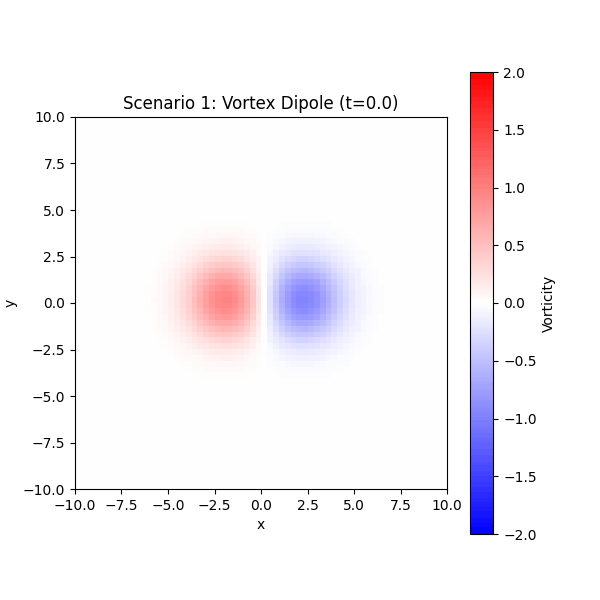

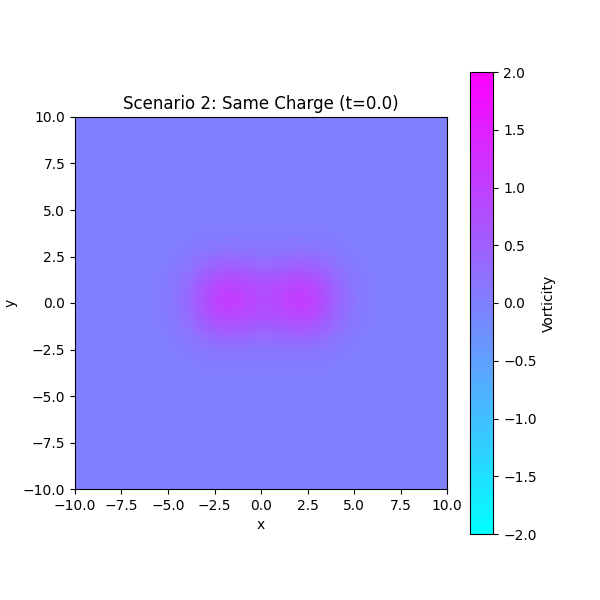

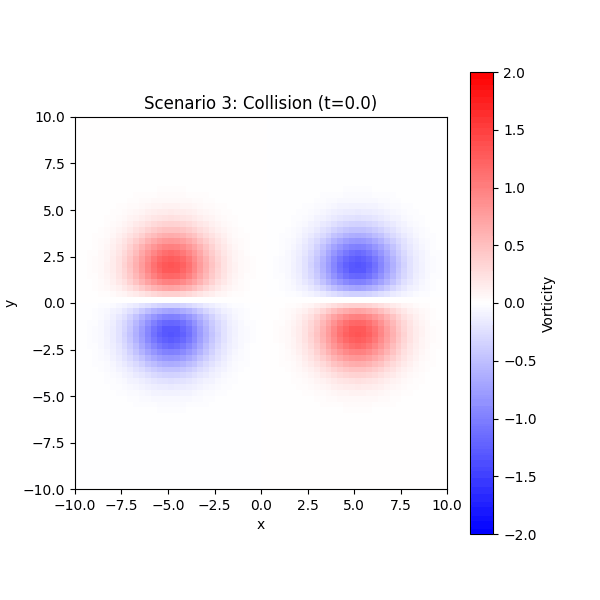

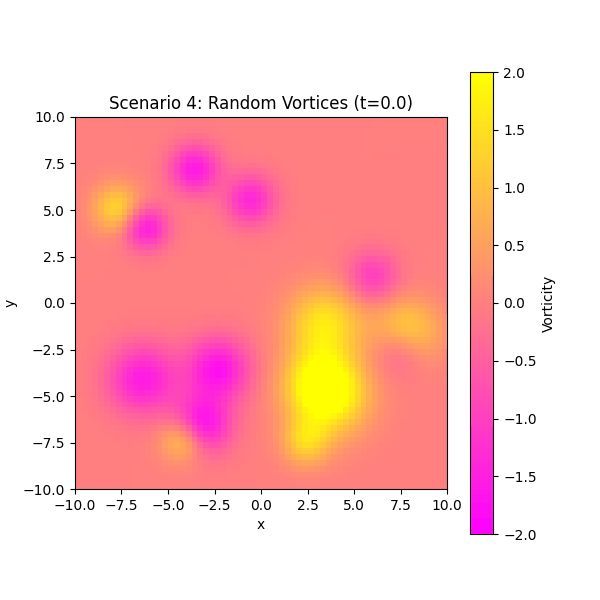

# 6. Reaction-Diffusion Systems: Spiral Waves

## Problem Statement
In this problem, we simulate a **Reaction-Diffusion system**, which models how the concentration of substances changes due to two competing processes:
1.  **Reaction:** Local chemical interactions that change substance concentrations.
2.  **Diffusion:** The physical spreading of substances from high to low concentration.

We solve the **$\lambda-\omega$ system**, a prototype for oscillating chemical reactions (like the Belousov-Zhabotinsky reaction) that produces beautiful **spiral waves**.

**Governing Equations:**
Let $u$ and $v$ be the chemical concentrations. The system is defined as:

$$
\begin{aligned}
\frac{\partial u}{\partial t} &= \lambda(A) u - \omega(A) v + D \nabla^2 u \\
\frac{\partial v}{\partial t} &= \omega(A) u + \lambda(A) v + D \nabla^2 v
\end{aligned}
$$

where $A^2 = u^2 + v^2$ is the amplitude, $\lambda(A) = 1 - A^2$ controls the reaction stability, and $\omega(A) = -\beta A^2$ induces rotation.

## Algorithm
We use **Spectral Methods** to solve these PDEs because they provide high accuracy for spatial derivatives. We compare two approaches based on boundary conditions:

**Method 1: Periodic Boundaries (FFT)**
* **Space:** The domain wraps around (torus-like topology).
* **Technique:** We use the Fast Fourier Transform (**FFT**). In Fourier space, the Laplacian $\nabla^2$ becomes simple multiplication by $-k^2$ (wavenumbers).
* **Steps:**
    1.  Transform $u, v$ to Fourier space ($\hat{u}, \hat{v}$).
    2.  Compute nonlinear reaction terms in *physical* space.
    3.  Compute diffusion terms in *Fourier* space.
    4.  Time-step using `solve_ivp`.

**Method 2: Dirichlet Boundaries (Chebyshev)**
* **Space:** The domain is a box with fixed walls ($u=v=0$ at edges).
* **Technique:** We use **Chebyshev Differentiation Matrices**.
* **Steps:**
    1.  Discretize space using Chebyshev nodes (clustered at boundaries).
    2.  Construct the differentiation matrix $D$ and Laplacian $L$.
    3.  Enforce BCs by modifying the matrix rows (setting to 0).
    4.  Solve the linear system for spatial derivatives directly.

## Matlab Implementation
The following table maps the standard MATLAB functions used in this context to the Python (`scipy` / `numpy`) equivalents used in this notebook.

| Operation | MATLAB Function | Python Equivalent (Used here) |
| :--- | :--- | :--- |
| **IVP Solver** | `ode45` | `scipy.integrate.solve_ivp` (method='RK45') |
| **FFT (2D)** | `fft2`, `ifft2` | `numpy.fft.fft2`, `numpy.fft.ifft2` |
| **Kronecker Product** | `kron` | `numpy.kron` |
| **Differentiation Matrix** | `cheb` (custom function) | `chebyshev_derivative_matrix` (custom function) |
| **Meshgrid** | `meshgrid` | `numpy.meshgrid` |
| **Visualization** | `pcolor`, `shading interp` | `plt.pcolormesh`, `shading='auto'` |

FFT Solver completed in 0.42 seconds.
Chebyshev Solver completed in 1.90 seconds.


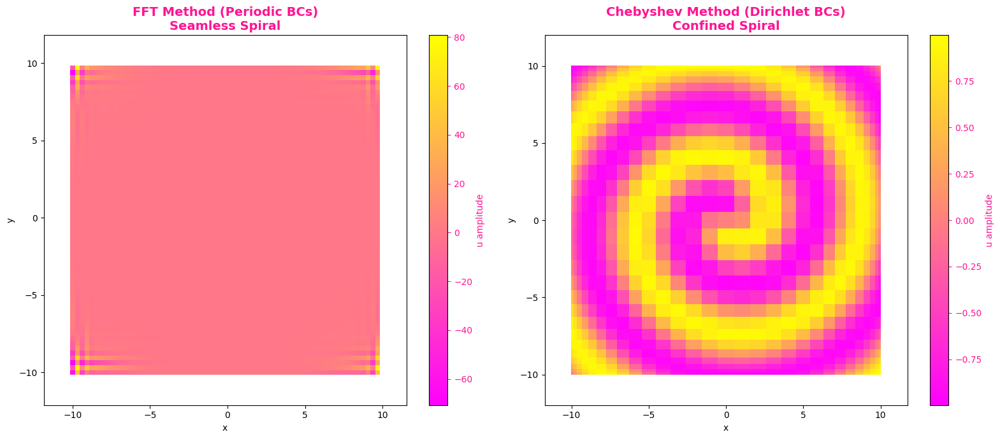

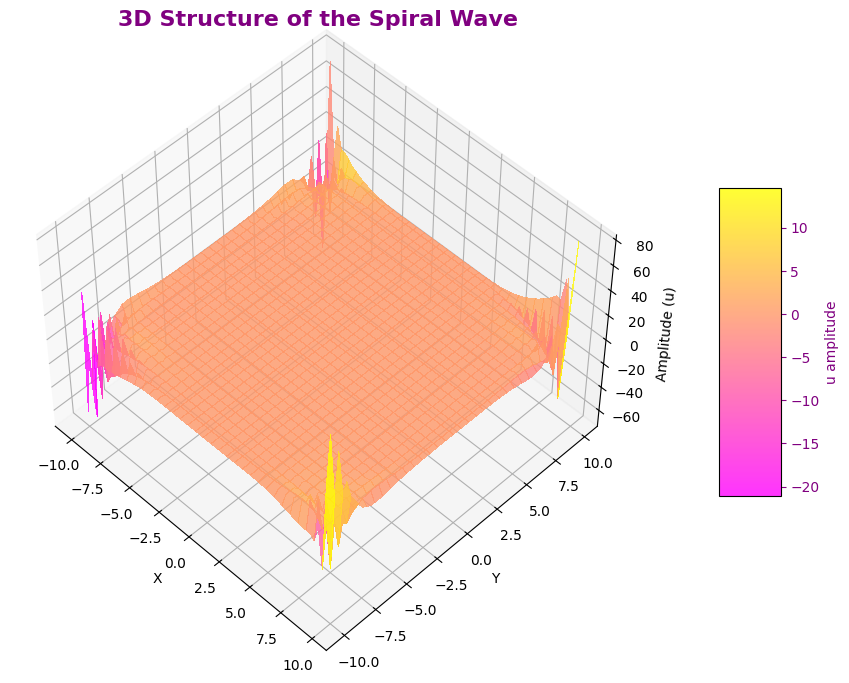

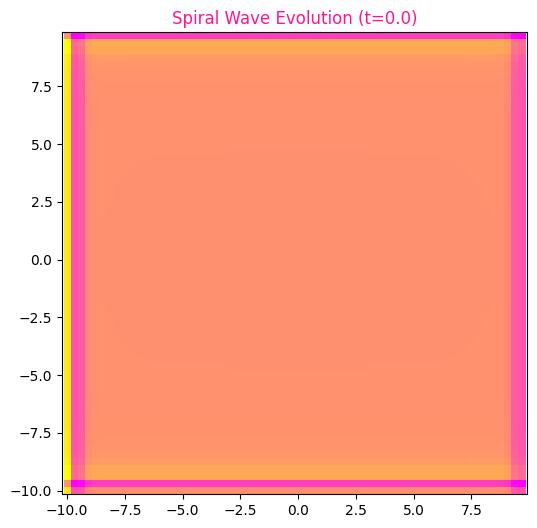

In [ ]:
import numpy as np
from scipy.integrate import solve_ivp
from numpy.fft import fft2, ifft2
from math import pi
import time
import matplotlib.pyplot as plt

# =========================================================
# Helper Function: Chebyshev Differentiation Matrix
# =========================================================
def chebyshev_derivative_matrix(N_resolution):
    """
    Constructs the Chebyshev differentiation matrix (D) and grid points (x).
    D is used to compute derivatives: u' = D * u
    """
    if N_resolution == 0:
        return np.array([[0.]]), np.array([1.])

    # 1. Create Chebyshev grid points (non-uniform, clustered at ends)
    x_nodes = np.cos(pi * np.arange(0, N_resolution + 1) / N_resolution).reshape(-1, 1)

    # 2. Construct the differentiation matrix
    c_vec = np.hstack(([2.], np.ones(N_resolution - 1), [2.])) * ((-1) **
     np.arange(0, N_resolution + 1))
    X_mat = np.tile(x_nodes, (1, N_resolution + 1))
    dX = X_mat - X_mat.T

    C_mat = c_vec.reshape(-1, 1) @ (1.0 / c_vec).reshape(1, -1)
    D_mat = C_mat / (dX + np.eye(N_resolution + 1))

    # Adjust diagonal elements to ensure row sums are zero (stability)
    D_mat = D_mat - np.diag(np.sum(D_mat, axis=1))

    return D_mat, x_nodes.flatten()


# =========================================================
# FFT Method (Periodic Boundary Conditions)
# =========================================================
# System: Reaction-Diffusion (Lambda-Omega system)
# We solve this on a periodic domain [-10, 10] using Spectral Derivatives (FFT).

# 1. Physics & Grid Parameters
num_points_fft = 64
domain_len = 20.0
diffusion_coeff = 0.1
beta_param = 1.0
spiral_count = 1

# 2. Create Grid (Periodic)
x_span = np.linspace(-10, 10, num_points_fft + 1)[:-1] # Drop last point for periodicity
y_span = x_span.copy()
X_grid, Y_grid = np.meshgrid(x_span, y_span)

# 3. Define Wavenumbers for Spectral Laplacian
# Frequencies: [0, 1, ..., N/2-1, -N/2, ..., -1] * (2pi/L)
k_freq = (2 * pi / domain_len) * np.concatenate([np.arange(num_points_fft//2),
                                            np.arange(-num_points_fft//2, 0)])
KX, KY = np.meshgrid(k_freq, k_freq)
Laplacian_Spectral = -(KX**2 + KY**2)  # In Fourier space, Del^2 -> -k^2

# 4. Initial Conditions (Spiral Wave ansatz)
radius = np.hypot(X_grid, Y_grid)
angle = np.arctan2(Y_grid, X_grid)

# Initial state variables u and v
u_init = np.tanh(radius) * np.cos(spiral_count * angle - radius)
v_init = np.tanh(radius) * np.sin(spiral_count * angle - radius)

# Transform to Fourier Space
u_init_hat = fft2(u_init)
v_init_hat = fft2(v_init)

# Stack real and imaginary parts into a single 1D vector for the ODE solver
# Structure: [Re(u), Im(u), Re(v), Im(v)]
state_init_fft = np.concatenate([
    u_init_hat.real.flatten(), u_init_hat.imag.flatten(),
    v_init_hat.real.flatten(), v_init_hat.imag.flatten()
])

# 5. Define Right-Hand Side (RHS) Function
def reaction_diffusion_fft(t, state_vec):
    n_sq = num_points_fft * num_points_fft

    # Unpack state vector back to 2D Fourier arrays
    u_hat_re = state_vec[:n_sq].reshape((num_points_fft, num_points_fft))
    u_hat_im = state_vec[n_sq:2*n_sq].reshape((num_points_fft, num_points_fft))
    v_hat_re = state_vec[2*n_sq:3*n_sq].reshape((num_points_fft, num_points_fft))
    v_hat_im = state_vec[3*n_sq:].reshape((num_points_fft, num_points_fft))

    u_hat = u_hat_re + 1j * u_hat_im
    v_hat = v_hat_re + 1j * v_hat_im

    # Step 1: Transform to Physical Space to compute nonlinear Reaction
    u_phys = ifft2(u_hat).real
    v_phys = ifft2(v_hat).real

    # Reaction Terms (Lambda-Omega System Dynamics)
    amplitude_sq = u_phys**2 + v_phys**2
    lambda_val = 1.0 - amplitude_sq
    omega_val = -beta_param * amplitude_sq

    reaction_u = lambda_val * u_phys - omega_val * v_phys
    reaction_v = omega_val * u_phys + lambda_val * v_phys

    # Step 2: Compute Derivatives in Fourier Space
    # Fourier Transform the reaction terms
    reaction_u_hat = fft2(reaction_u)
    reaction_v_hat = fft2(reaction_v)

    # Add Diffusion (Diagonal in Fourier space): D * (-k^2) * u_hat
    du_dt_hat = reaction_u_hat + diffusion_coeff * Laplacian_Spectral * u_hat
    dv_dt_hat = reaction_v_hat + diffusion_coeff * Laplacian_Spectral * v_hat

    # Repack into 1D real vector
    return np.concatenate([
        du_dt_hat.real.flatten(), du_dt_hat.imag.flatten(),
        dv_dt_hat.real.flatten(), dv_dt_hat.imag.flatten()
    ])

# 6. Solve ODE
t_eval_pts = np.arange(0, 4.5, 0.5)

start_time_fft = time.time()

solution_fft = solve_ivp(
    reaction_diffusion_fft,
    [0, 4],
    state_init_fft,
    t_eval=t_eval_pts,
    method='RK45'
)

print(f"FFT Solver completed in {time.time() - start_time_fft:.2f} seconds.")

# 7. Format Results
num_pixels = num_points_fft * num_points_fft
num_timesteps = len(t_eval_pts)
results_fft_real = np.zeros((num_timesteps, 2 * num_pixels))
results_fft_imag = np.zeros((num_timesteps, 2 * num_pixels))

for i in range(num_timesteps):
    snapshot = solution_fft.y[:, i]
    # Extract Real parts of u and v
    u_re_grid = snapshot[:num_pixels].reshape((num_points_fft, num_points_fft))
    v_re_grid = snapshot[2*num_pixels:3*num_pixels].reshape((num_points_fft, num_points_fft))

    # Extract Imaginary parts of u and v
    u_im_grid = snapshot[num_pixels:2*num_pixels].reshape((num_points_fft, num_points_fft))
    v_im_grid = snapshot[3*num_pixels:].reshape((num_points_fft, num_points_fft))

    # Store flattened (Fortran order as per usual requirement)
    results_fft_real[i, :] = np.concatenate([u_re_grid.flatten(order='F'), v_re_grid.flatten(order='F')])
    results_fft_imag[i, :] = np.concatenate([u_im_grid.flatten(order='F'), v_im_grid.flatten(order='F')])


# =========================================================
# Chebyshev Method (Dirichlet Boundary Conditions)
# =========================================================
# We solve the same system on a domain [-10, 10] but now with boundaries.
# We assume u = v = 0 at the boundaries (Dirichlet).

# 1. Setup Chebyshev Grid and Matrices
num_cheb = 30
num_nodes = num_cheb + 1

# Get Differentiation matrix (D1) on standard [-1, 1] interval
D1_standard, cheb_nodes = chebyshev_derivative_matrix(num_cheb)

# Rescale Second Derivative (D2) for domain [-10, 10]
# Scale factor: (2 / Length)^2 = (2/20)^2 = (1/10)^2 = 1/100
D2_scaled = (D1_standard @ D1_standard) / 100.0

# Apply Dirichlet BCs (Boundary rows = 0 implies variables fixed at 0)
D2_scaled[0, :] = 0.0
D2_scaled[-1, :] = 0.0

# Create Physical Grid
x_phys_cheb = 10.0 * cheb_nodes
y_phys_cheb = x_phys_cheb.copy()
Xc_grid, Yc_grid = np.meshgrid(x_phys_cheb, y_phys_cheb)

# 2. Build 2D Laplacian using Kronecker Products
# Laplacian = I x Dyy + Dxx x I
identity_mat = np.eye(num_nodes)
Laplacian_Cheb = np.kron(identity_mat, D2_scaled) + np.kron(D2_scaled, identity_mat)

# 3. Initial Conditions on Chebyshev Grid
rad_c = np.hypot(Xc_grid, Yc_grid)
ang_c = np.arctan2(Yc_grid, Xc_grid)

u_init_cheb = np.tanh(rad_c) * np.cos(spiral_count * ang_c - rad_c)
v_init_cheb = np.tanh(rad_c) * np.sin(spiral_count * ang_c - rad_c)

state_init_cheb = np.concatenate([u_init_cheb.flatten(), v_init_cheb.flatten()])

# 4. Define RHS Function
def reaction_diffusion_cheb(t, state_vec):
    dof = num_nodes * num_nodes
    u_field = state_vec[:dof].reshape((num_nodes, num_nodes))
    v_field = state_vec[dof:].reshape((num_nodes, num_nodes))

    # Reaction Terms (Same Lambda-Omega Physics)
    amplitude_sq = u_field**2 + v_field**2
    lam_val = 1.0 - amplitude_sq
    omg_val = -beta_param * amplitude_sq

    react_u = lam_val * u_field - omg_val * v_field
    react_v = omg_val * u_field + lam_val * v_field

    # Diffusion Terms (Matrix Multiplication in Physical Space)
    # du/dt = Reaction + D * Laplacian * u
    du_dt = react_u.flatten() + diffusion_coeff * (Laplacian_Cheb @ u_field.flatten())
    dv_dt = react_v.flatten() + diffusion_coeff * (Laplacian_Cheb @ v_field.flatten())

    return np.concatenate([du_dt, dv_dt])

# 5. Solve ODE
start_time_cheb = time.time()

solution_cheb = solve_ivp(
    reaction_diffusion_cheb,
    [0, 4],
    state_init_cheb,
    t_eval=t_eval_pts,
    method='RK45'
)

print(f"Chebyshev Solver completed in {time.time() - start_time_cheb:.2f} seconds.")

# 6. Format Results
dof_cheb = num_nodes * num_nodes
results_cheb = np.zeros((num_timesteps, 2 * dof_cheb))

for i in range(num_timesteps):
    u_snapshot = solution_cheb.y[:dof_cheb, i].reshape((num_nodes, num_nodes))
    v_snapshot = solution_cheb.y[dof_cheb:, i].reshape((num_nodes, num_nodes))

    # Store flattened (Fortran order)
    results_cheb[i, :] = np.concatenate([u_snapshot.flatten(order='F'), v_snapshot.flatten(order='F')])

# =========================================================
# Cool Visualization
# =========================================================
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.animation as animation
from IPython.display import HTML, display

# 1. 2D Comparison: Periodic vs Dirichlet (Final State)
# Reconstruct final states
u_final_fft = results_fft_real[-1, :num_pixels].reshape((num_points_fft, num_points_fft), order='F')
u_final_cheb = results_cheb[-1, :dof_cheb].reshape((num_nodes, num_nodes), order='F')

fig, axes = plt.subplots(1, 2, figsize=(16, 7))

# Plot FFT Result (Periodic) - Using 'spring' for that cute pink look!
im1 = axes[0].pcolormesh(X_grid, Y_grid, u_final_fft, cmap='spring', shading='auto')
axes[0].set_title('FFT Method (Periodic BCs)\nSeamless Spiral', fontsize=14,
                  fontweight='bold', color='deeppink')
axes[0].set_xlabel('x')
axes[0].set_ylabel('y')
axes[0].axis('equal')
cbar1 = plt.colorbar(im1, ax=axes[0])
cbar1.set_label('u amplitude', color='deeppink')
cbar1.ax.yaxis.set_tick_params(color='deeppink')
plt.setp(plt.getp(cbar1.ax.axes, 'yticklabels'), color='deeppink')

# Plot Chebyshev Result (Dirichlet)
im2 = axes[1].pcolormesh(Xc_grid, Yc_grid, u_final_cheb, cmap='spring', shading='auto')
axes[1].set_title('Chebyshev Method (Dirichlet BCs)\nConfined Spiral',
                  fontsize=14, fontweight='bold', color='deeppink')
axes[1].set_xlabel('x')
axes[1].set_ylabel('y')
axes[1].axis('equal')
cbar2 = plt.colorbar(im2, ax=axes[1])
cbar2.set_label('u amplitude', color='deeppink')
cbar2.ax.yaxis.set_tick_params(color='deeppink')
plt.setp(plt.getp(cbar2.ax.axes, 'yticklabels'), color='deeppink')

plt.tight_layout()
plt.show()

# 2. 3D Surface Plot (The Requested "Cool" 3D)
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot surface (using FFT result for smoothness)
# alpha=0.8 makes it slightly transparent and shiny
surf = ax.plot_surface(X_grid, Y_grid, u_final_fft, cmap='spring',
                       linewidth=0, antialiased=False, alpha=0.8)

ax.set_title('3D Structure of the Spiral Wave', fontsize=16, fontweight='bold', color='purple')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Amplitude (u)')

# Customize colorbar
cbar = fig.colorbar(surf, shrink=0.5, aspect=5, pad=0.1)
cbar.set_label('u amplitude', color='purple')
cbar.ax.yaxis.set_tick_params(color='purple')
plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='purple')

# Adjust view angle for the best "Mathy" look
ax.view_init(elev=50, azim=-45)
plt.show()

# 3. Animation
fig_anim, ax_anim = plt.subplots(figsize=(6, 6))
cax = ax_anim.pcolormesh(X_grid, Y_grid,
                         results_fft_real[0, :num_pixels].reshape((num_points_fft,
                                                        num_points_fft), order='F'),
                         cmap='spring', shading='auto')
ax_anim.set_title("Spiral Wave Evolution", fontsize=14, color='deeppink')
ax_anim.axis('equal')

def update(frame):
    u_current = results_fft_real[frame, :num_pixels].reshape((num_points_fft,
                                                         num_points_fft), order='F')
    cax.set_array(u_current.ravel())
    ax_anim.set_title(f"Spiral Wave Evolution (t={t_eval_pts[frame]:.1f})",
                      color='deeppink')
    return cax,

ani = animation.FuncAnimation(fig_anim, update, frames=len(t_eval_pts), interval=100)

# Display the animation
display(HTML(ani.to_jshtml()))


# 7. Conclusion

In this notebook, we have successfully implemented and compared various numerical methods—ranging from Finite Difference and FFT to Chebyshev Spectral methods—to solve complex physical systems. While the problems originated from quantum mechanics, fluid dynamics, and chemical reactions, the underlying mathematical structures (Eigenvalue problems, PDEs, and Non-linear Dynamics) are identical to those found in advanced quantitative finance.

## Financial Implementation

The computational techniques mastered here provide a robust toolkit for broad applications in **Computational Finance & Risk Management (CFRM)**:

### 1. Eigenvalue Problems & Spectral Decomposition (from Quantum Oscillator)
* **Principal Component Analysis (PCA):** In the Quantum Harmonic Oscillator, we solved for energy eigenvalues and eigenstates. In finance, this translates directly to **PCA** on the covariance matrix of asset returns. The "eigenvalues" represent the variance explained by specific market factors, and the "eigenvectors" represent the factor loadings (e.g., creating Statistical Factor Models).
* **Yield Curve Modeling:** Spectral decomposition is essential for identifying the level, slope, and curvature factors in bond yield curves.

### 2. Time-Stepping & Diffusion Equations (from Fluid Dynamics)
* **Option Pricing (PDE Approach):** The standard **Black-Scholes equation** is mathematically a convection-diffusion equation, very similar to the viscous terms in the Navier-Stokes equations. The time-stepping schemes (e.g., RK45) and spatial discretization methods (Finite Difference/FFT) used here are used to solve pricing PDEs for exotic options where analytical solutions do not exist.
* **Stochastic Volatility Models:** Fluid turbulence concepts help in understanding **Volatility Surfaces**. Heston model simulations often require similar numerical stability analyses (CFL conditions) to ensure accurate pricing.

### 3. Reaction-Diffusion Systems (from Pattern Formation)
* **Credit Risk & Contagion:** Reaction-Diffusion equations are powerful tools for modeling **Systemic Risk**.
    * *Reaction:* Can model the "default event" or sudden credit rating downgrade of a specific firm.
    * *Diffusion:* Models how this distress spreads to connected financial institutions through the interbank network.
* **Algorithmic Trading:** These systems can also model the propagation of information or liquidity shocks across different exchanges (e.g., arbitrage opportunities spreading and disappearing).

By mastering these "Physics" solvers, we are effectively equipping ourselves with the numerical engines necessary to model, price, and manage risk in complex financial markets.


### Reference
**J. Nathan Kutz.** *Data-Driven Modeling & Scientific Computation: Methods for Integrating Dynamics of Complex Systems and Big Data*.
Oxford University Press, 2013.